## Background: generative models

| Discriminative models | Generative models |
|:---|:---|
|<img src='https://raw.githubusercontent.com/airi-industrial-ai/ec23-tutorial/main/notebooks/discriminative_learning.png' width=300>|<img src='https://raw.githubusercontent.com/airi-industrial-ai/ec23-tutorial/main/notebooks/generative_learning.png' width=300>|
| Aims to predict the label by the given example| Aims to learn the full data distribution by the given subsample |
| Learns the probability $y \sim P(y|X)$ | Learns the probability $X,y \sim P(X, y)$ or $X \sim P(X)$ |
| _Examples of tasks:_ | _Examples of tasks:_ |
| 1. Is a cat on the photo? | 1. Create a photo of a cat that looks like the average of two given cat photos |
| 2. How old is a person on the photo? | 2. Create a photo of an avocado armchair |
| 3. What is the most likely number of tourists the next mounth? | 3. Write an essay on the topic of global warming |
| _Examples of models:_ | _Examples of models:_ |
| Decision Tree, Support Vector Machine (SVM), Convolutional Neural Network (CNN) | Autoregressive model (AR), Generative Adversarial Network (GAN), Variational Autoencoder (VAE), Generative Pretrained Transformer (GPT)|

_An image is taken from https://medium.com/@jordi299/about-generative-and-discriminative-models-d8958b67ad32_

Deep generative models are based on deep neural networks.

<img src='https://raw.githubusercontent.com/airi-industrial-ai/ec23-tutorial/main/notebooks/space_generator.png' width=600>

## Background: Generative Adversarial Network for time series

<img src='https://raw.githubusercontent.com/airi-industrial-ai/ec23-tutorial/main/notebooks/gan_for_ts.png' width=600>

A Generative Adversarial Network (GAN) is a type of model that consists of two neural networks: a generator and a discriminator.

* The objective of a generator (G) is to create realistic data
* The objective of a discriminator (D) is to detect fake data

We note the multivariate time series as $X_1, X_2, \dots, X_N$, where $X_t \in R^d$

The general objective of GAN is

$$\min_G \max_D V(D, G) = \mathbb E_{X} \log(D(X)) + \mathbb E_{Z} \log(1 - D(G(Z))$$

In this tutorial we use GAN where a generator and a discriminator are Temporal Convolutional Networks (TCN).

<img src='https://raw.githubusercontent.com/airi-industrial-ai/ec23-tutorial/main/notebooks/tcn.png' width=600>

_An image is taken from Oord, Aaron van den, et al. "Wavenet: A generative model for raw audio." arXiv preprint arXiv:1609.03499 (2016)._

The main advantages of TCN:
* Exponentially large receptive field — TCN can detect long and short patterns
* Can be applied to time series of arbitrary length
* Causal convolution prevents leakage from the future

The key parameter of TCN is the number of channels (also known as filters, kernels).

For generator:
* Input channels: latent space dimensionality
* Hidden channels: some large number to model temporal relationships
* Output channels: time series dimensionality

For discriminator:
* Input channels: time series dimensionality
* Hidden channels: some large number to model temporal relationships
* Output channels: 1 (the probability that the data is fake)

## Generation of time series

In [ ]:
!pip install git+https://github.com/airi-industrial-ai/ec23-tutorial -q
!pip install git+https://github.com/avo-milas/genrisk -q
!git clone https://github.com/IzyGolstein/ts2vec.git


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 812.3/812.3 kB 17.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 868.8/868.8 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 14.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 107.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pandas<2.2.2dev0,>=2.0, but you have pandas 1.5.3 which is incompatible.
google-colab 1.0.0 requires pandas==2.1.4, but you have pandas 1.5.3 which is incompatible.
xarray 2024.6.0 requires pandas>=2.0, but you have pandas 1.5.3 which is incompatible.
Cloning into 'ts2vec'...
remote: Enumerating object

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

from ectutorial.data import get_ett_dataset
from genrisk.generation import TCNGAN

We download the [ETT](https://github.com/zhouhaoyi/ETDataset) dataset.

In [ ]:
ett = get_ett_dataset()
ett.head()

,HUFL,HULL,MUFL,MULL,LUFL,LULL,OT
date,,,,,,,
2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4.203,1.340,30.531000
2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4.142,1.371,27.787001
2016-07-01 02:00:00,5.157,1.741,1.279,0.355,3.777,1.218,27.787001
2016-07-01 03:00:00,5.090,1.942,1.279,0.391,3.807,1.279,25.044001
2016-07-01 04:00:00,5.358,1.942,1.492,0.462,3.868,1.279,21.948000


In [ ]:
import seaborn as sns
sns.set(style="whitegrid")

def plot_fakes(ett, test_data, new_fakes):
  num_cols = len(ett.columns)
  fig, axes = plt.subplots(num_cols, 1, figsize=(12, 3 * num_cols), sharex=True, dpi=150)
  if num_cols == 1:
      axes = [axes]
  times = 500
  for ax, col in zip(axes, ett.columns):
      ax.plot(test_data[col].values[:times], label='val data', c='black', linewidth=2)
      for fake_data in new_fakes[:5]:
          ax.plot(fake_data[col].values[:times], alpha=0.5)

      ax.set_title(col, fontsize=14)
      ax.legend(loc='upper right')
      ax.set_ylabel('Value', fontsize=12)

  axes[-1].set_xlabel('Time', fontsize=12)

  # fig.suptitle('Comparison of Validation Data and Synthetic Data', fontsize=16)
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])
  plt.show()

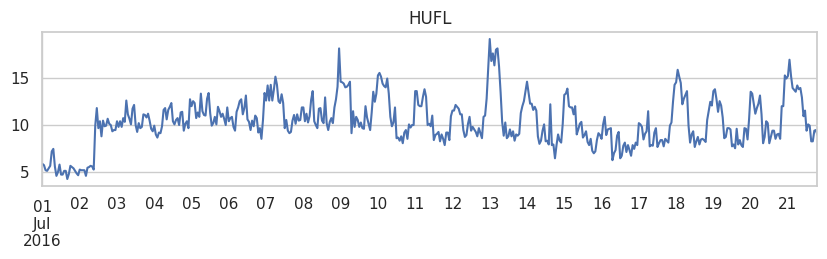

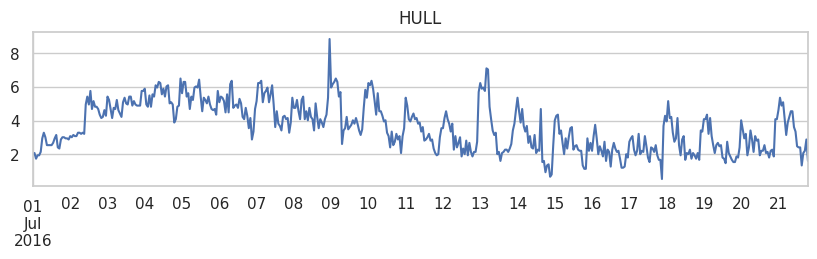

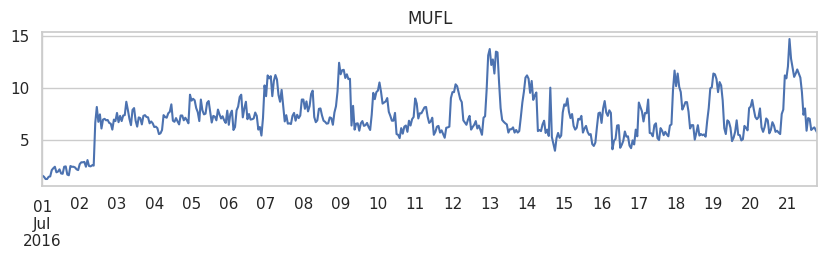

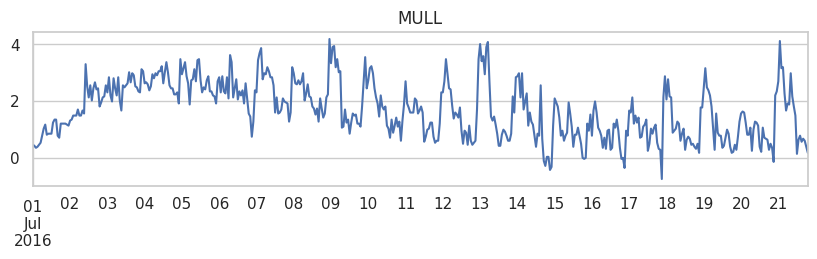

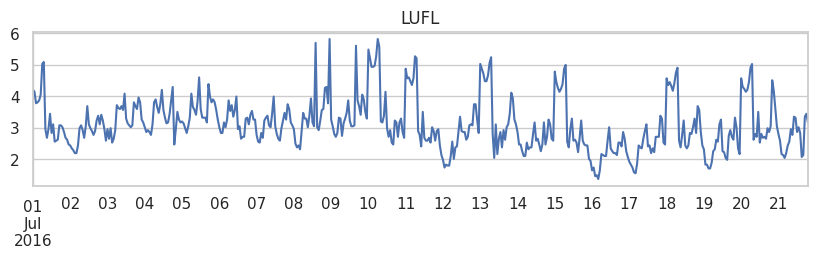

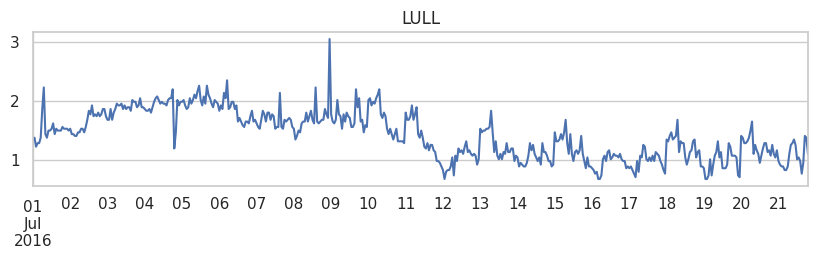

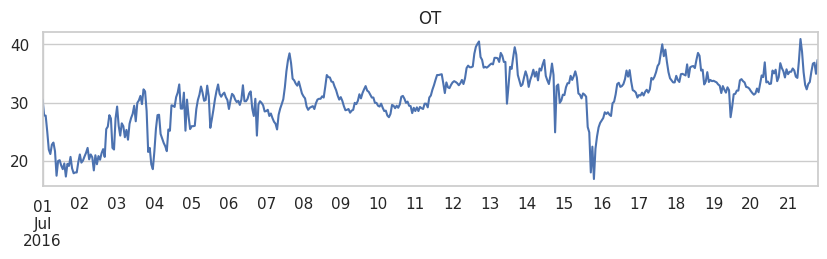

In [ ]:
for col in ett.columns:
    plt.figure(figsize=(10, 2))
    ett[col].iloc[:500].plot()
    plt.title(col)
    plt.xlabel('')
    plt.show()

We use the simple positional ecnoding to encode calendar information. The day of week is encoded as follows
$$
\text{pos. encoding}(i) = \left(\sin \frac{i2\pi}{6} , \cos \frac{i2\pi}{6} \right)
$$
where $i$ is the number of a day which is in the range from 0 to 6. In the same way, we define positional encoding for the day of month and the month number.

In [ ]:
def positional_encoding(index, freqs):
    encoding = []
    for freq in freqs:
        values = getattr(index, freq)
        num_values = max(values) + 1
        steps = [x * 2.0 * np.pi / num_values for x in values]
        encoding.append(pd.DataFrame({f'{freq}_cos': np.cos(steps), f'{freq}_sin': np.sin(steps)}, index=index))
    encoding = pd.concat(encoding, axis=1)
    return encoding

In [ ]:
cov = positional_encoding(ett.index, ['dayofweek', 'day', 'month'])
cov.head()


,dayofweek_cos,dayofweek_sin,day_cos,day_sin,month_cos,month_sin
date,,,,,,
2016-07-01 00:00:00,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 01:00:00,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 02:00:00,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 03:00:00,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 04:00:00,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316


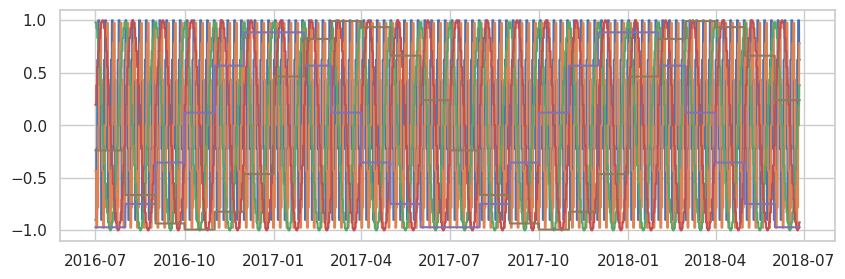

In [ ]:
plt.figure(figsize=(10, 3))
plt.plot(cov)
plt.show()

We concatenate the target columns and covariates.

In [ ]:
ett_cov = pd.concat([ett, cov], axis=1)
ett_cov

,HUFL,HULL,MUFL,MULL,LUFL,LULL,OT,dayofweek_cos,dayofweek_sin,day_cos,day_sin,month_cos,month_sin
date,,,,,,,,,,,,,
2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4.203,1.340,30.531000,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4.142,1.371,27.787001,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 02:00:00,5.157,1.741,1.279,0.355,3.777,1.218,27.787001,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 03:00:00,5.090,1.942,1.279,0.391,3.807,1.279,25.044001,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 04:00:00,5.358,1.942,1.492,0.462,3.868,1.279,21.948000,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-06-26 15:00:00,-1.674,3.550,-5.615,2.132,3.472,1.523,10.904000,0.623490,0.781831,0.382683,-0.92388,-0.970942,0.239316
2018-06-26 16:00:00,-5.492,4.287,-9.132,2.274,3.533,1.675,11.044000,0.623490,0.781831,0.382683,-0.92388,-0.970942,0.239316
2018-06-26 17:00:00,2.813,3.818,-0.817,2.097,3.716,1.523,10.271000,0.623490,0.781831,0.382683,-0.92388,-0.970942,0.239316


We split the dataset into train, validation, test sets.

In [ ]:
val_thresh = int(ett_cov.shape[0] * 0.7)
test_thresh = int(ett_cov.shape[0] * 0.85)

train_data = ett_cov.iloc[:val_thresh].copy()
val_data = ett_cov.iloc[val_thresh:test_thresh].copy()
test_data = ett_cov.iloc[test_thresh:].copy()

We apply the standard scaler for the normalization.

In [ ]:
scaler = StandardScaler()
train_data.loc[:, ett.columns] = scaler.fit_transform(train_data.loc[:, ett.columns])
val_data.loc[:, ett.columns] = scaler.transform(val_data.loc[:, ett.columns])
test_data.loc[:, ett.columns] = scaler.transform(test_data.loc[:, ett.columns])

The shape of a batch is (the batch size, the length of time series, the dimensionality of time series).

Let us define our TCN GAN:
* `latent_dim` — the dimensionality of latent space which is Miltivariate Normal Distribution.
* `hidden_dim` — the number of channels/filters/kernels in the hidden layers
* `target_dim` — the dimenstionality of time series
* `num_layers` — the number of TCN layers
* `lr` — the learning rate for the optimization step

The values of parameters can be tuned using some search strategies, such as grid or random search.

In [ ]:
gen_simple = TCNGAN(
    target_columns=ett.columns,
    conditional_columns=cov.columns,
    kernel_size=2,
    hidden_dim=64,
    latent_dim=8,
    num_layers=4,
    num_disc_steps=1,
    window_size=200,
    batch_size=16,
    num_epochs=4,
    lr=0.001,
    verbose=True,
)
gen_simple.fit(train_data)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name | Type              | Params | Mode 
---------------------------------------------------
0 | gen  | _TCNGenerator     | 61.1 K | train
1 | disc | _TCNDiscriminator | 60.5 K | train
---------------------------------------------------
121 K     Trainable params
0         Non-trainable params
121 K     Total params
0.486     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=4` reached.


We can sample fake time series.

In [ ]:
fakes = gen_simple.sample(train_data, n_samples=1)
fake_data = fakes[0]
fake_data.head()

,HUFL,HULL,MUFL,MULL,LUFL,LULL,OT,day_cos,dayofweek_sin,month_cos,dayofweek_cos,day_sin,month_sin
date,,,,,,,,,,,,,
2016-07-01 00:00:00,0.782805,0.177386,-0.110030,-0.543298,0.333784,0.194780,-0.124151,0.980785,-0.433884,-0.970942,-0.900969,0.19509,-0.239316
2016-07-01 01:00:00,-0.183434,0.456237,-0.631521,-0.274526,-0.063578,-0.586279,-0.210396,0.980785,-0.433884,-0.970942,-0.900969,0.19509,-0.239316
2016-07-01 02:00:00,0.591793,0.554114,-0.242303,-0.317639,1.412827,0.389769,-0.057292,0.980785,-0.433884,-0.970942,-0.900969,0.19509,-0.239316
2016-07-01 03:00:00,0.462770,0.700080,-0.675201,-0.326966,1.060807,-0.209285,0.321496,0.980785,-0.433884,-0.970942,-0.900969,0.19509,-0.239316
2016-07-01 04:00:00,0.560067,1.157488,-0.977746,-0.973852,0.311625,0.156645,0.212488,0.980785,-0.433884,-0.970942,-0.900969,0.19509,-0.239316


We can compare fake and real time series using the pair plot.

In [ ]:
def fakereal_pairplot(fake_data, real_data, size=500):
    random_idx = np.random.randint(len(real_data), size=size)

    _fake_plot = fake_data.iloc[random_idx].copy()
    _fake_plot['source'] = 'fake'

    _real_plot = real_data.iloc[random_idx].copy()
    _real_plot['source'] = 'real'

    concated = pd.concat([_fake_plot, _real_plot])

    sns.pairplot(
        concated,
        hue='source',
        corner=True,
        plot_kws={'edgecolor': 'none', 'alpha': 0.3, 's': 10},
    )

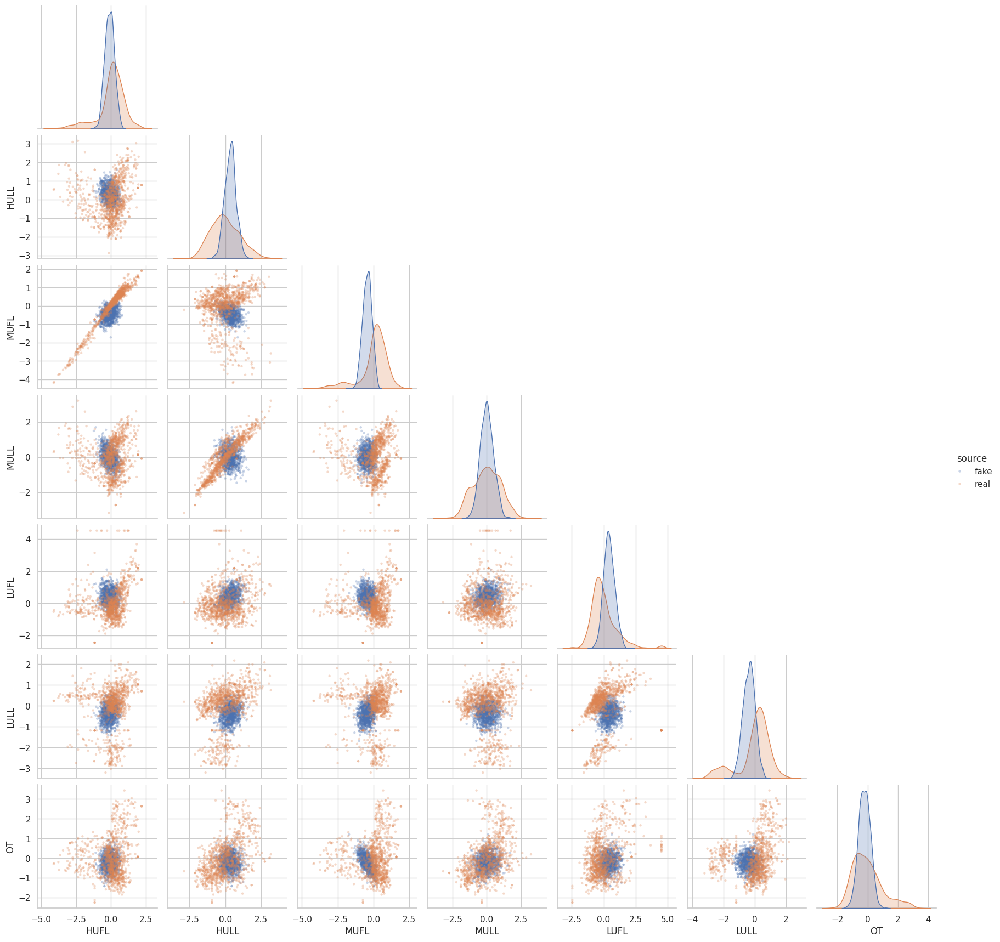

In [ ]:
fakereal_pairplot(fake_data[ett.columns], train_data[ett.columns], size=1000)

Let us also plot the trajectories of fake and real time series.

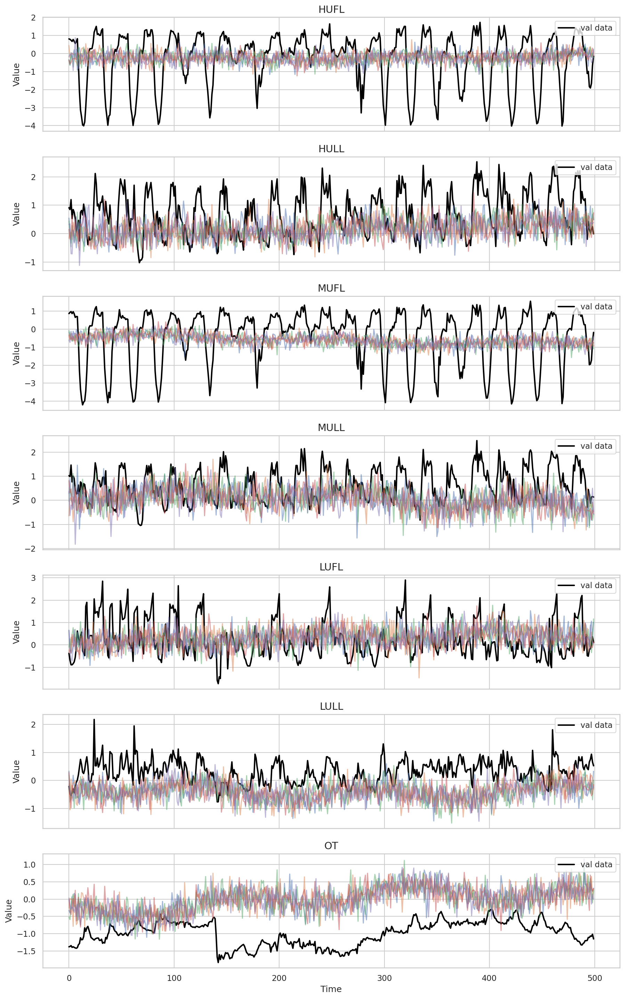

In [ ]:
fakes_simple = gen_simple.sample(test_data, n_samples=50)
plot_fakes(ett, test_data, fakes_simple[:5])

In [ ]:
from ts2vec.DataQualityMetrics import DataQualityMetrics

In [ ]:
real_columns = ['HUFL',	'HULL',	'MUFL',	'MULL',	'LUFL',	'LULL', 'OT']

real_data = test_data.reset_index()[real_columns]
metrics = DataQualityMetrics()
metrics_to_evaluate = ['Context-FID Score','Correlational Score']
results_simple ,dataset_result_simple = metrics.evaluate_data(real_data, fakes_simple, real_columns,metrics_to_evaluate)

Summary Results: {'Correlational Score': 0.21377680477987088, 'Context-FID Score': 4.103930755380977}


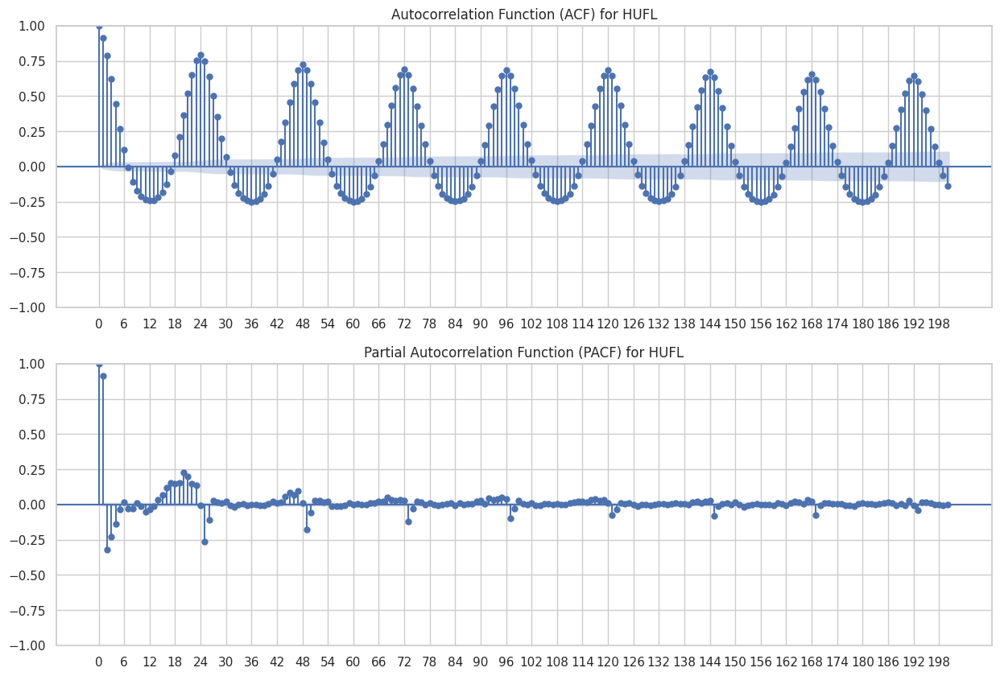

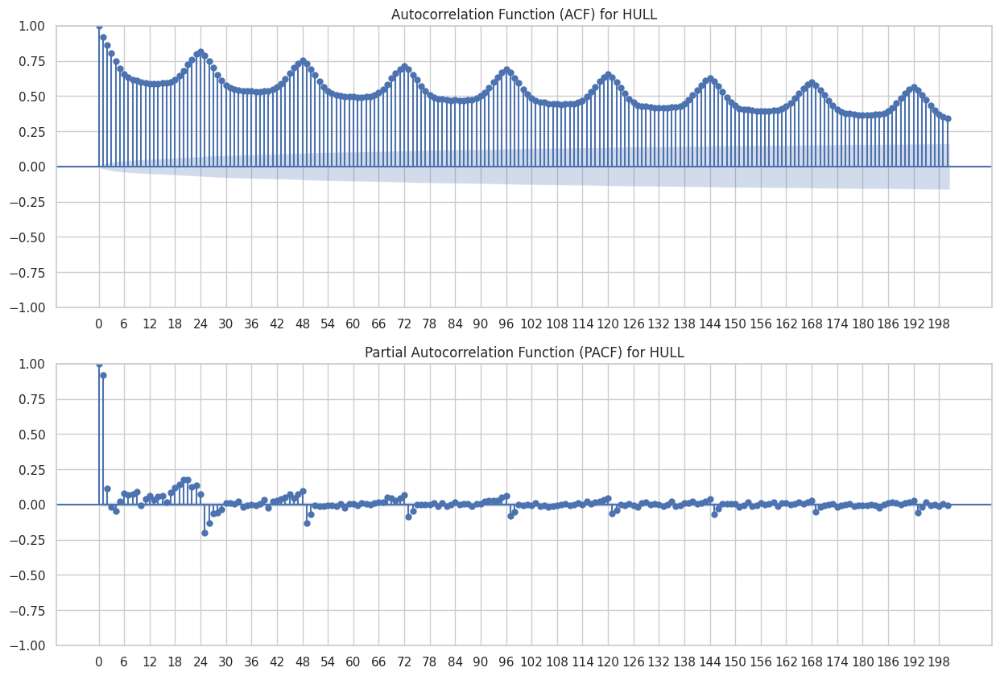

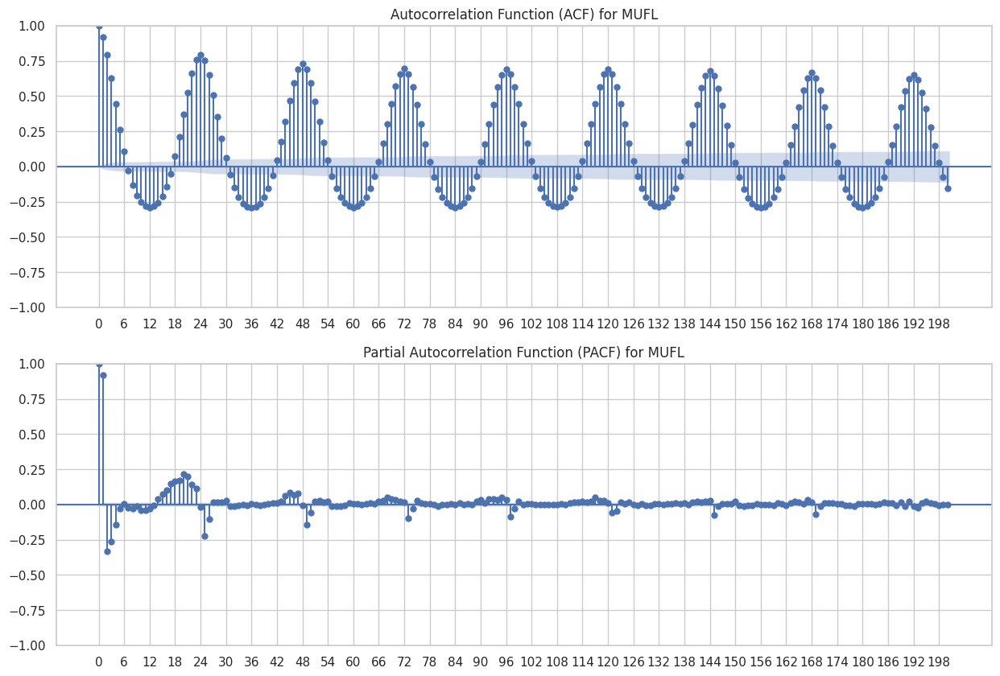

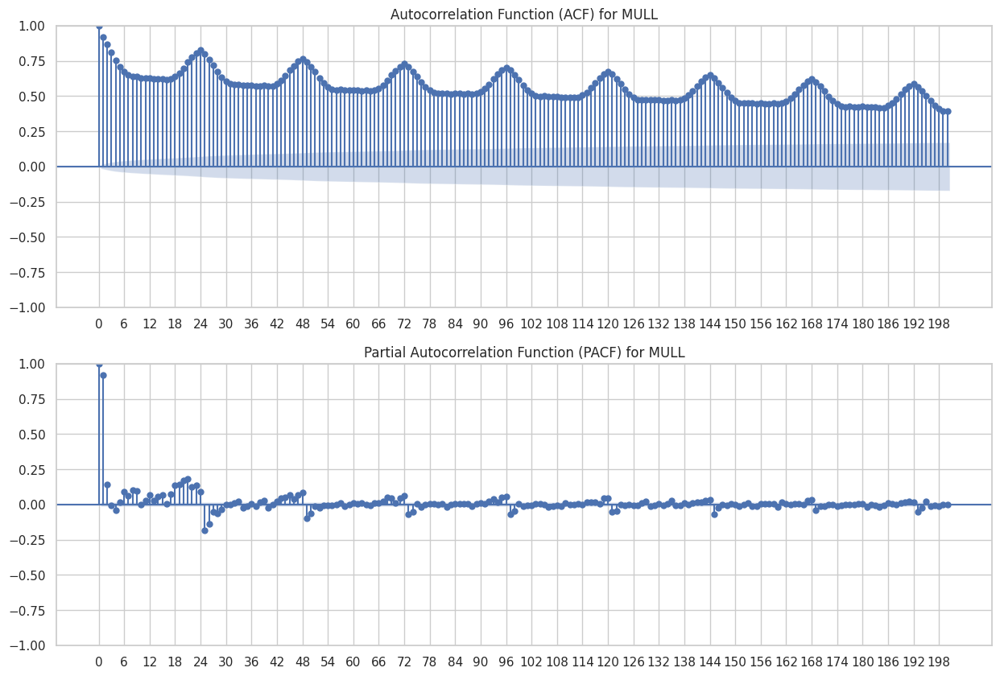

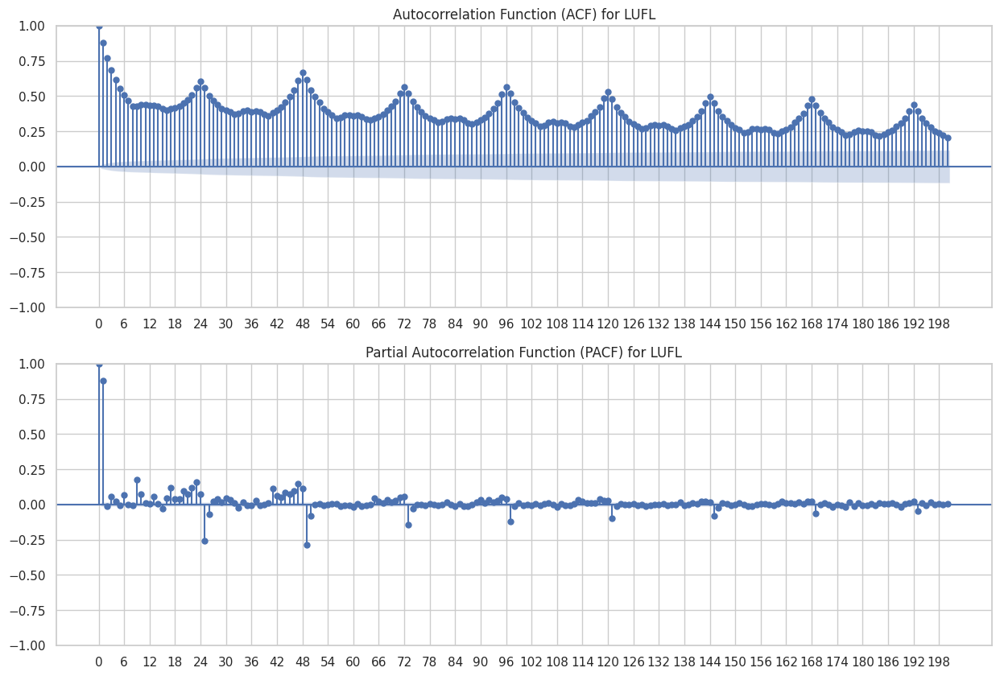

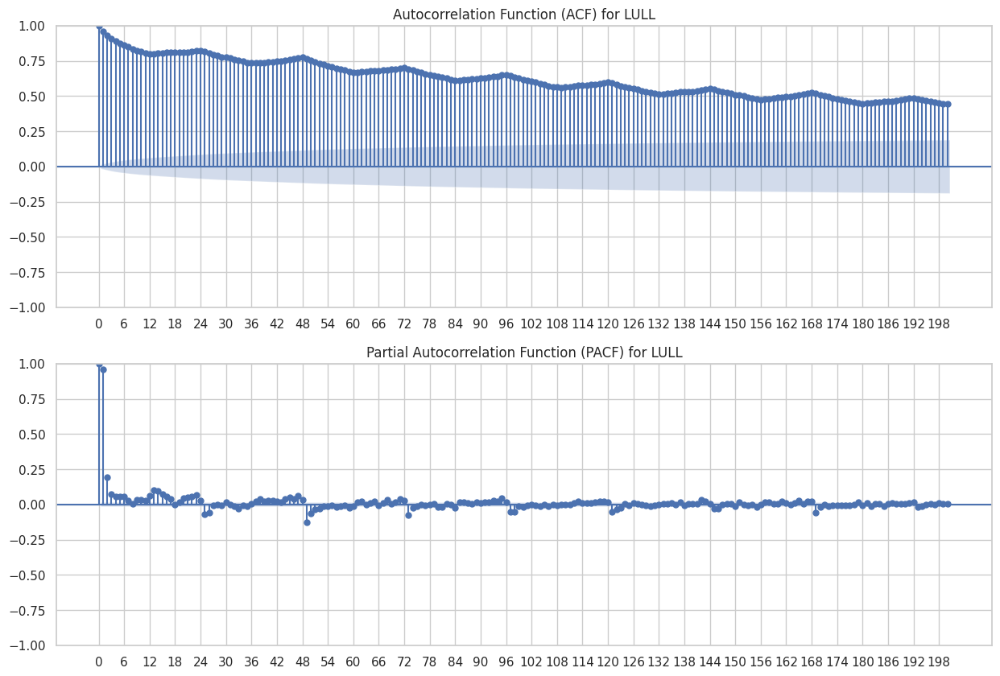

In [ ]:
from ts2vec.trendseasonalitydecomposition import TrendSeasonalityDecomposition

timeseries_model = TrendSeasonalityDecomposition()
timeseries_model.plot(ett_cov, ['HUFL',	'HULL',	'MUFL',	'MULL',	'LUFL',	'LULL'], 200)

We split the dataset into train, validation, test sets.

In [ ]:
val_thresh = int(ett_cov.shape[0] * 0.7)
test_thresh = int(ett_cov.shape[0] * 0.85)

train_data = ett_cov.iloc[:val_thresh].copy()
val_data = ett_cov.iloc[val_thresh:test_thresh].copy()
test_data = ett_cov.iloc[test_thresh:].copy()

We apply the standard scaler for the normalization.

In [ ]:
scaler = StandardScaler()
train_data.loc[:, ett.columns] = scaler.fit_transform(train_data.loc[:, ett.columns])
val_data.loc[:, ett.columns] = scaler.transform(val_data.loc[:, ett.columns])
test_data.loc[:, ett.columns] = scaler.transform(test_data.loc[:, ett.columns])

In [ ]:
train_data_decomposed = timeseries_model.fit(train_data, ett.columns, 24)
active_cols = train_data_decomposed.columns
train_data_decomposed = pd.concat([train_data_decomposed, cov], axis=1)
train_data_decomposed.dropna(inplace=True)
train_data_decomposed.head()


,trend_HUFL,trend_HULL,trend_MUFL,trend_MULL,trend_LUFL,trend_LULL,trend_OT,seasonal_HUFL,seasonal_HULL,seasonal_MUFL,...,residual_MULL,residual_LUFL,residual_LULL,residual_OT,dayofweek_cos,dayofweek_sin,day_cos,day_sin,month_cos,month_sin
date,,,,,,,,,,,,,,,,,,,,,
2016-07-01 00:00:00,-0.257517,0.026356,-0.478826,-0.130074,1.084890,0.849146,1.702985,-0.040544,0.002453,0.001318,...,0.022182,-0.011738,-0.018293,0.021000,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 01:00:00,-0.247430,0.025989,-0.465800,-0.171030,1.358789,0.935804,1.430615,-0.039168,0.031219,-0.047437,...,-0.074388,0.334621,0.114816,-0.305094,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 02:00:00,-0.310964,-0.023948,-0.440166,-0.203346,1.368779,0.804481,1.410538,0.018622,0.007365,-0.123953,...,-0.058741,0.012254,-0.173916,-0.022168,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 03:00:00,-0.297236,0.088520,-0.334422,-0.122493,1.564103,0.832592,1.121733,-0.088203,-0.287660,-0.333183,...,0.146111,0.238616,0.037274,-0.323491,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 04:00:00,-0.295557,0.236047,-0.230548,-0.009880,1.699354,0.820712,0.818892,-0.034810,-0.495109,-0.400032,...,0.203585,0.165219,-0.015697,-0.339198,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316


The shape of a batch is (the batch size, the length of time series, the dimensionality of time series).

Let us define our TCN GAN:
* `latent_dim` — the dimensionality of latent space which is Miltivariate Normal Distribution.
* `hidden_dim` — the number of channels/filters/kernels in the hidden layers
* `target_dim` — the dimenstionality of time series
* `num_layers` — the number of TCN layers
* `lr` — the learning rate for the optimization step

The values of parameters can be tuned using some search strategies, such as grid or random search.

In [ ]:
gen = TCNGAN(
    target_columns=active_cols,
    conditional_columns=cov.columns,
    kernel_size=2,
    hidden_dim=64,
    latent_dim=8,
    num_layers=4,
    num_disc_steps=1,
    window_size=200,
    batch_size=16,
    num_epochs=4,
    lr=0.001,
    verbose=True,
)
gen.fit(train_data_decomposed)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name | Type              | Params | Mode 
---------------------------------------------------
0 | gen  | _TCNGenerator     | 62.0 K | train
1 | disc | _TCNDiscriminator | 63.2 K | train
---------------------------------------------------
125 K     Trainable params
0         Non-trainable params
125 K     Total params
0.501     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=4` reached.


In [ ]:
fakes = gen.sample(train_data[cov.columns], n_samples=50)
def fakereal_pairplot(fake_data, real_data, size=500):
    random_idx = np.random.randint(len(real_data), size=size)

    _fake_plot = fake_data.iloc[random_idx].copy()
    _fake_plot['source'] = 'fake'

    _real_plot = real_data.iloc[random_idx].copy()
    _real_plot['source'] = 'real'

    concated = pd.concat([_fake_plot, _real_plot])

    sns.pairplot(
        concated,
        hue='source',
        corner=True,
        plot_kws={'edgecolor': 'none', 'alpha': 0.3, 's': 10},
    )


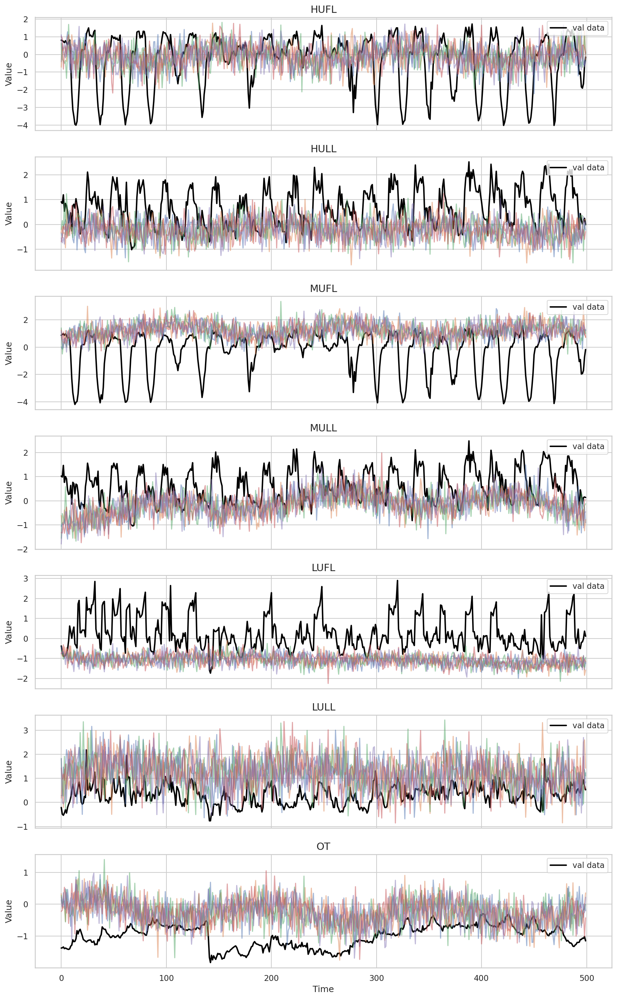

In [ ]:
def summurize_columns(data, columns):
    df = pd.DataFrame()
    for col_keyword in columns:
        filtered_cols = data.columns[data.columns.str.contains(col_keyword)]
        df[col_keyword] = data[filtered_cols].sum(axis=1)
    return df

real_columns = ['HUFL',	'HULL',	'MUFL',	'MULL',	'LUFL',	'LULL', 'OT']
new_fakes = []

for i in fakes:
    i = summurize_columns(i,real_columns)
    new_fakes.append(i)


plot_fakes(ett, test_data, new_fakes)

In [ ]:
metrics = DataQualityMetrics()
metrics_to_evaluate = ['Context-FID Score','Correlational Score']
results_simple_ets,dataset_result_ets = metrics.evaluate_data(real_data, new_fakes, real_columns,metrics_to_evaluate)

Summary Results: {'Correlational Score': 0.26529174527488725, 'Context-FID Score': 3.3838035579500887}


In [ ]:
from genrisk.generation.diffusion import DenoisingDiffusion

In [ ]:
conditional_columns = ['dayofweek_cos', 'dayofweek_sin', 'day_cos', 'day_sin', 'month_cos', 'month_sin']

gen_dif = DenoisingDiffusion(
    target_columns=real_columns,
    conditional_columns=conditional_columns,
    kernel_size=4,
    hidden_dim=64,
    latent_dim=8,
    num_layers=5,
    lr=0.01,
    num_epochs=150,
    num_timesteps=5,
    verbose=False
)
gen_dif.fit(train_data)

Epoch 1/150:   0%|          | 0/1 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:306: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at ../aten/src/ATen/native/Convolution.cpp:1031.)
  return F.conv1d(input, weight, bias, self.stride,


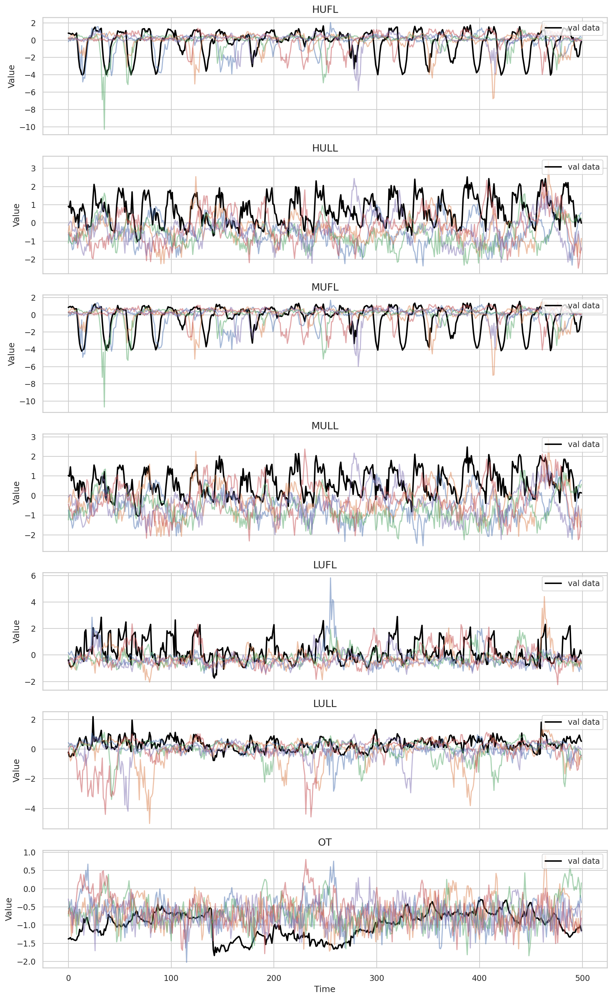

In [ ]:
fakes_diff = gen_dif.sample(test_data, n_samples=50)
plot_fakes(ett, test_data, fakes_diff)

In [ ]:
metrics = DataQualityMetrics()
metrics_to_evaluate = ['Context-FID Score','Correlational Score']
results_diff,dataset_result_diff = metrics.evaluate_data(real_data, fakes_diff, real_columns,metrics_to_evaluate)

Summary Results: {'Correlational Score': 0.12756846050801846, 'Context-FID Score': 1.3181744473410208}


In [ ]:
gen_diff_ets = DenoisingDiffusion(
    target_columns=active_cols,
    conditional_columns=conditional_columns,
    kernel_size=4,
    hidden_dim=64,
    latent_dim=8,
    num_layers=5,
    lr=0.01,
    num_epochs=150,
    num_timesteps=5,
    verbose=False
)
gen_diff_ets.fit(train_data_decomposed)

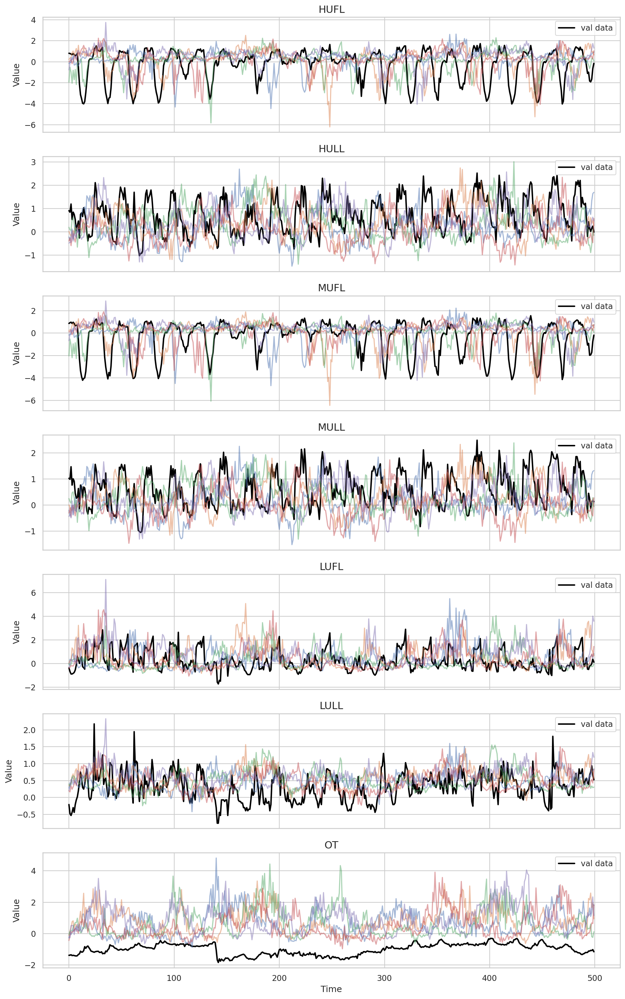

In [ ]:
def summurize_columns(data, columns):
    df = pd.DataFrame()
    for col_keyword in columns:
        filtered_cols = data.columns[data.columns.str.contains(col_keyword)]
        df[col_keyword] = data[filtered_cols].sum(axis=1)
    return df

real_columns = ['HUFL',	'HULL',	'MUFL',	'MULL',	'LUFL',	'LULL', 'OT']
new_fakes_diff_ets = []
fakes_tmp = gen_diff_ets.sample(train_data_decomposed, n_samples=50)

for i in fakes_tmp:
    i = summurize_columns(i,real_columns)
    new_fakes_diff_ets.append(i)

plot_fakes(ett, test_data, new_fakes_diff_ets)


In [ ]:
metrics = DataQualityMetrics()
metrics_to_evaluate = ['Context-FID Score','Correlational Score']
results_diff_ets,dataset_result_diff_ets = metrics.evaluate_data(real_data, new_fakes_diff_ets, real_columns,metrics_to_evaluate)

Summary Results: {'Correlational Score': 0.146773047963627, 'Context-FID Score': 1.308183849188487}


In [ ]:
from scipy import stats

datasets = [dataset_result_diff_ets, dataset_result_ets, dataset_result_simple, dataset_result_diff]
names = ["diff_ets", "ets", "simple", "diff"]

# Создаем пустой DataFrame
results_df = pd.DataFrame()

# Функция для расчета среднего и доверительного интервала
def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data)
    n = len(a)
    m, se = np.mean(a), stats.sem(a)
    h = se * stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

# Заполняем DataFrame
for dataset, name in zip(datasets, names):
    for key in dataset.keys():
        mean, lower, upper = mean_confidence_interval(dataset[key])
        results_df.loc[key, f'{name}_CI'] = f'[{( lower):.3f}, {upper:.3f}]'



In [ ]:
results_df

,diff_ets_CI,ets_CI,simple_CI,diff_CI
Correlational Score,"[0.146, 0.147]","[0.265, 0.266]","[0.213, 0.214]","[0.126, 0.129]"
Context-FID Score,"[1.296, 1.320]","[3.379, 3.388]","[4.095, 4.113]","[1.295, 1.342]"


In [ ]:
results_df.columns = ['Diffusion + ETS', 'GAN + ETS', 'GAN', 'Diffusion']

In [ ]:
results_df

,Diffusion + ETS,GAN + ETS,GAN,Diffusion
Correlational Score,"[0.146, 0.147]","[0.265, 0.266]","[0.213, 0.214]","[0.126, 0.129]"
Context-FID Score,"[1.296, 1.320]","[3.379, 3.388]","[4.095, 4.113]","[1.295, 1.342]"
